In [1]:
import os, sys
import numpy as np
import math
from scipy.signal import get_window
import matplotlib.pyplot as plt
import IPython.display as ipd
sys.path.append('../../software/transformations/')
sys.path.append('../../software/models/')
import utilFunctions as UF
from utilFunctions import wavread, wavwrite
import sineModel as SM
import stft
import harmonicTransformations as HT
import harmonicModel as HM
import spsModel as SPS
import hpsModel as HPS
import sineTransformations as SMT
import stochasticTransformations as STCT


# Part 1

In [2]:
"""
read the sound and display it
"""
input_file = 'sound-mono.wav'
fs, x = wavread(input_file)
ipd.display(ipd.Audio(data=x, rate=fs))

In [3]:
def plot_spectrogram(xmX, M, N, H, fs):
    # part of the code is from sms-tools/lectures/04-STFT/plots-code/spectrogram.py:
    plt.figure(1, figsize=(15, 10))

    plt.subplot(211)
    numFrames = int(xmX[:,0].size)
    frmTime = H*np.arange(numFrames)/fs                            
    binFreq = np.arange(N/2+1)*float(fs)/N                         
    plt.pcolormesh(frmTime, binFreq, np.transpose(xmX))
    plt.title('xmX, M=' + str(M) + ', N=' + str(N) + ', H=' + str(H))
    plt.autoscale(tight=True)
    plt.ylabel('Frequency (Hz)')
    plt.xlabel('Time (s)')

    plt.tight_layout()
    plt.show()

In [4]:
def roundup_plus_1(n):
    """
    returns the closest ceil 100 * n + 1 
    """
    return int(math.ceil(n / 100.0)) * 100 + 1

In [5]:
def closest_up_2_power(n):
    """
    returns the closest ceil power of 2 with respect to n
    """
    return int(2**math.ceil(math.log(n, 2)))

In [6]:
def closest_down_2_power(n):
    """
    returns the closest floor power of 2 with respect to n
    """
    return int(2**math.floor(math.log(n, 2)))

M: 2401
H: 128


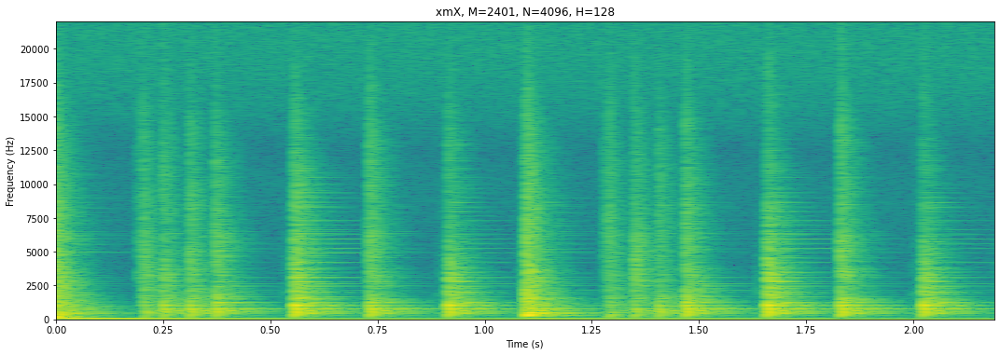

Text(0, 0.5, 'amplitude')

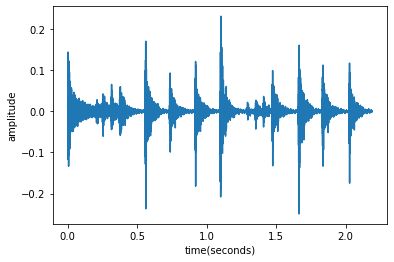

In [7]:
"""
compute its STFT and show the magnitude spectra
"""

# blackman is the default window for music. Even that this is not a 100% harmonical sound,
# there are some identificable pitches, 
window = 'blackman'

# size of the window has to be at least fs / lowest_freq * 6(blackman_bins). Analyzing the
# sound we can see that the lowest frequency is around 132Hz, I will add a margin of 20Hz.
lowest_freq = 132
# added a margin
margin = 20
# blackman bin size for the mainlobe
n_bin_mainlobe = 6
# compute the high closest k * 100 + 1 number
M = roundup_plus_1(fs / (lowest_freq - margin) * n_bin_mainlobe)
print("M:",M)
# FFT size is the closest power of 2 with respect to M
N = closest_up_2_power(M)
H = 128
print("H:",H)

w = get_window(window, M)
xmX, xpX = stft.stftAnal(x, w, N, H)
plot_spectrogram(xmX, M, N, H, fs)

plt.plot(np.linspace(0,len(x)/fs, num=len(x)),x)
plt.xlabel("time(seconds)")
plt.ylabel("amplitude")

In [8]:
"""
explain why you choose this sound fragment
"""
# I chose this fragment since it consist of a percussion loop. The rest of the sound is basically
# the same rhythmic pattern being repeated, so I just picket a representative fragment.

'\nexplain why you choose this sound fragment\n'

In [9]:
"""
Describe the sound by using its temporal and spectral representation, 
focusing on what should be useful for processing the sound with spectral 
models, thus for deciding the spectral analysis parameters
"""
# As we can see in both the spectrogram and the wave form, this is a really percussive sound with
# really aggressive attacks. Some of the strokes has a marked pitch, as we can see in the first one
# which has a clear identifiable pitch around 100Hz.

'\nDescribe the sound by using its temporal and spectral representation, \nfocusing on what should be useful for processing the sound with spectral \nmodels, thus for deciding the spectral analysis parameters\n'

# Part 2 (option b): Theme and variations

In [10]:
"""
Choose a model that would allow to perform an adequate analysis of the 
sound, thinking on the transformation application. Perform the analysis
and check that the synthesis without transformations is good. Explain 
the choices made and the result obtained
"""

# The model I choose to perform the analysis and transformations is 
# the sinusoidal + stochastic model, since this sound it's not a harmonic
# one and some of the percussive components could be represented with a
# stochastic model

# blackmanharris is default window for synthesis
window = 'blackmanharris'
# We could have used the same window size than the one used for the analysis, 
# however, this is a percussion sound, so if the window is too big, the transients gets
# really affected. In order to obtain better transients, the window size will be reduced
# this will make that the mainlobe on the lowest frequency will not be absolutely separated
# from the other mainlobes, but since this is a percussive sound, the timbre of the sound 
# should not be too affected.

# multiple of 100 * k + 1 for the window size
M = 2001

# closes power of 2: 2048
N = closest_up_2_power(M)

# threshold was chosen by try & error 
t = -80

# we can see that there are no strokes smaller than 20ms
minSineDur = 0.02

# I will use a 200 harmonic representation in order to reconstruct the whole signal
maxnSines = 200

# 11 was chosen by try & error
freqDevOffset = 11

# same as the slope
freqDevSlope = 0.01

# try/error strategy to obtain the best HPS synthesis. The higher, the more frequency filters
# are created, but it also has the tradeoff of a heavier stochastic representation.
stocf = 0.75

# parameters for synthesis
H = 128
Ns = 512

# (fs, x) = UF.wavread(input_file)
w = get_window(window, M, fftbins=True)

# Analysis using the SPS model
sfreq, smag, sphase, stocEnv = SPS.spsModelAnal(
    x,
    fs,
    w,
    N,
    H,
    t,
    minSineDur,
    maxnSines,
    freqDevOffset,
    freqDevSlope,
    stocf
)
# Synthesis using the SPS model
y, ys, yst = SPS.spsModelSynth(sfreq, smag, sphase, stocEnv, Ns, H, fs)

ipd.display(ipd.Audio(data=x, rate=fs))
ipd.display(ipd.Audio(data=y, rate=fs))

In [11]:
# create files structure
if not os.path.exists('train'):
    os.makedirs('train')
if not os.path.exists('train/foreground'):
    os.makedirs('train/foreground')
if not os.path.exists('train/background'):
    os.makedirs('train/background')

In [12]:
# Create drumloop transformation
"""
To create a drumloop I will use the previous analysis cropped sound and use the 
stochasticTimeScale and the sineTimeScale to scale in time the stochastic and 
sinusoids obtained in the Sinusoidal + stochastical analysis. I want it have 
x2 the length

Since there's no method to timestretch focused in the SPS, I am merging both 
the Sinusoidal model and the Stochastic time stretch. However,
I will have to manually duplicate the phases.
"""
# duplicate the phases
phase=np.zeros(shape=(sphase.shape[0]*2,sphase.shape[1]))
phase_index = 0
sphase_index = 0
while phase_index < phase.shape[0]:
    phase[phase_index] = sphase[sphase_index]
    phase[phase_index + 1] = sphase[sphase_index]
    phase_index += 2
    sphase_index += 1

# create the array for the time stretch
timeScaling = np.array([0, 0, 1, 2])

# pass the array through both the sine and stochastic time scale models
ytfreq, ytmag = SMT.sineTimeScaling(sfreq, smag, timeScaling)
ystocEnv = STCT.stochasticTimeScale(stocEnv, timeScaling)

# sinthesis with the duplicated sine and stochastic + the new phase
y, ys, yst = SPS.spsModelSynth(ytfreq, ytmag, phase, ystocEnv, Ns, H, fs)

# I want a 4x loop
drumloop = np.append(np.append(y,y), np.append(y,y))
ipd.display(ipd.Audio(data=drumloop, rate=fs))

# write the loop
wavwrite(drumloop, fs, 'train/foreground/drums.wav')

In [13]:
# create bass transformation
"""
For the bass I will make a granular synthesis of the first stroke of the percussion instrument.
I will preserve the attack of the stroke and then add some windowed tails to create a sustain
"""
# stroke starts on 0 and lasts 0.207s
window_size = closest_down_2_power(int(0.207*fs))
stroke = x[0:window_size]
# The cropped stroke
ipd.display(ipd.Audio(data=stroke, rate=fs))

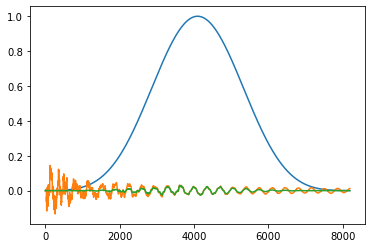

In [14]:
# I will create a bass note of 1/8 of the loop
bass_stroke = np.zeros(int(len(drumloop)/8))

# the hop to sum the different granular parts of the sound should be long enough to not create
# a frequency modulation based on a repeated pattern and small enough to not have spaces between
# grains
hop = 1024

# blackmanharris is the default window of synthesis
window = 'blackmanharris'
w = get_window(window,window_size)

# plot the window and the signal
plt.plot(w)
plt.plot(stroke)
plt.plot(stroke*w)
ipd.display(ipd.Audio(data=stroke*w, rate=fs))


# to preserve the attack i will window every grain except for the first one:
bass_stroke[0:window_size] += stroke
i = 0

# run over the bass stroke concatenating the windowed grains
while i < len(bass_stroke)-window_size:
    bass_stroke[i:i+window_size] += stroke*w
    i += hop

ipd.display(ipd.Audio(data=bass_stroke, rate=fs))


In [15]:
# sounds terrible, right? but now that I have a pitch I can perform a
# harmonic analysis

In [16]:
# blackman window since is the default for music
window='blackman'

# a window size long enough to identify the f0 k * 100 + 1
M=2001

# closest power of 2
N=closest_up_2_power(M)
H=128
f0et=5.0
t=-90
# the F0 of this new sound is between the 80Hz and 200Hz
minf0=80
maxf0=200

# parameters for synthesis where Ns is 4x the Analysis Hop size
nH = 250
Ns = 512

# get the window
w = get_window(window, M)

# create a freq scaling with a fast and small increase in pitch and then a small decrease
# in the decay to recreate a 808 bass
freqScaling = np.array([0, 0.7, 0.06, 0.5, 1, 0.5])
# small modulation in freq stretching to make it interesting
freqStretching = np.array([0, 1, 1, 0.99])
# I do not want to preserve the pitch to make it different from the percussive stroke
timbre_pres = 0

# Analysis
xhfreq, xhmag, xhphase = HM.harmonicModelAnal(bass_stroke, fs, w, N, H, t, nH, minf0, maxf0, f0et)
yhfreq, yhmag = HT.harmonicFreqScaling(
    xhfreq,
    xhmag,
    freqScaling,
    freqStretching,
    timbre_pres,
    fs
)
# synthesis 
bass_stroke_808 = SM.sineModelSynth(yhfreq, yhmag, np.array([]), Ns, H, fs)
ipd.display(ipd.Audio(data=bass_stroke_808, rate=fs))

In [17]:
# we have our 808 ;)

In [18]:
# I want to create a 3rd sound for the pad based on a frequency shifted bass stroke

# I will use the same analyzes sound to create this pluck sound, but this will be
# higher in pitch and will have an increasing freq stretching instead of decreasing

w = get_window(window, M)
freqScaling = np.array([0, 2.5, 1, 2.5])
freqStretching = np.array([0, 1, 1, 1.05])
timbre_pres = 0

yhfreq, yhmag = HT.harmonicFreqScaling(
    xhfreq,
    xhmag,
    freqScaling,
    freqStretching,
    timbre_pres,
    fs
)
# synthesis 
pad_stroke = SM.sineModelSynth(yhfreq, yhmag, np.array([]), Ns, H, fs)
ipd.display(ipd.Audio(data=pad_stroke, rate=fs))

In [19]:
# We have a F0 at around 68Hz so I will modify the range of the F0 in the harmonic model analysis
# using a generic method to modify the duration and pitch of the notes

In [20]:
# now I will create an 8 notes array for the bass using the sinusoidal model
def create_harmony_line(notes_array, duration_array, note_audio, total_length, fs, w, N, H, t, nH, minf0, maxf0, f0et, Ns, attack_time_ms):
    musicline = np.zeros(total_length)
    fade_in = np.linspace(0, 1, int(0.080 * fs))
    fade_out = np.linspace(1, 0, int(0.080 * fs))
    
    xhfreq, xhmag, xhphase = HM.harmonicModelAnal(note_audio, fs, w, N, H, t, nH, minf0, maxf0, f0et)
    i = 0
    index = 0
    for note in notes_array:
        
        yhfreq, yhmag = HT.harmonicFreqScaling(
            xhfreq,
            xhmag,
            np.array([0,note,1,note]),
            np.array([0,1,1,1]),
            1,
            fs
        )
        
        # synthesis
        single_note = SM.sineModelSynth(yhfreq, yhmag, np.array([]), Ns, H, fs)        
        
        # adjust sustain duration
        note_length = math.floor(total_length/8*duration_array[index])
        single_note = single_note[0:note_length]
        
        # however, we missed the attack, so I will replace the attack with the original
        attack_time = int(attack_time_ms*fs)
        crossfade = int(0.08*fs)
        #crop the attack of the original sound
        attack_note = note_audio[0:attack_time]
        # create a fadeout in the end
        attack_note[attack_time-crossfade:attack_time] *= np.linspace(1, 0, crossfade)
        # if not silence:
        if not(notes_array[index] == 0):
            #crop note before the attack
            single_note[0:attack_time-crossfade] *= 0
            # create a fade in to mix with the attack
            single_note[attack_time-crossfade:attack_time] *= np.linspace(0, 1, crossfade)

            single_note[0:attack_time] += attack_note[0:attack_time]

            # fade in and fade out
            single_note[len(single_note)-len(fade_out):len(single_note)] *= fade_out
        
        
        musicline[i:i+note_length] += single_note[0:note_length]
        
        i += note_length
        index += 1
    
    
    return musicline
        

In [21]:
# we create the notes array (1 to preserve) 1.2 is 20% higher with respect to 1
notes = np.array([1,0.8,1.2,1,0,1,0.8,1.2,1.34])
# we create the duration array (1 being 1/8 of the full length)
durations = np.array([1,0.5,0.5, 1,1,1,0.5,0.5, 1])

# defalt window for music
window = 'blackmanharris'

M = 2001
print("M:",M)
# FFT size is the closest power of 2 with respect to M
N = closest_up_2_power(M)
H = 256
t=-100
# the F0 of our brand new 808
minf0=60
maxf0=80
nH = 150
Ns = 512
f0et = 5
# the attack time is to crop the sound and preserve the attack after the transformation
attack_time_ms = 0.126


w = get_window(window, M)

bass_line = create_harmony_line(
    notes,
    durations,
    bass_stroke_808,
    len(drumloop),
    fs,
    w,
    N,
    H,
    t,
    nH,
    minf0,
    maxf0,
    f0et,
    Ns,
    attack_time_ms
)

M: 2001


In [22]:
ipd.display(ipd.Audio(data=bass_line, rate=fs))
wavwrite(bass_line, fs, 'train/background/bass.wav')

In [23]:
# create voice transformation pluck line
notes = np.array(
    [
        1,
        1,
        0.8,
        1.2,
        1.8,
        1.2,
        1,
        1.34,
        0,
        0,
        1,
        1,
        1.34,
        0.8,
        1.2,
        1,
        1.15,
        1.15,
    ]
)
durations = np.array(
    [
        1,
        1,
        0.5,
        0.5,
        0.5,
        0.5,
        1,
        1,
        1,
        1,
        1,
        1,
        0.5,
        0.5,
        0.5,
        0.5,
        1,
        1
    ]
)/2
window = 'blackmanharris'

M = 2001
print("M:",M)
# FFT size is the closest power of 2 with respect to M
N = closest_up_2_power(M)
H = 256
t=-150
# this new sound has its f0 between 250 and 400Hz
minf0=250
maxf0=400
nH = 250
Ns = 512
f0et = 5

w = get_window(window, M)

pad_line = create_harmony_line(
    notes,
    durations,
    pad_stroke,
    len(drumloop),
    fs,
    w,
    N,
    H,
    t,
    nH,
    minf0,
    maxf0,
    f0et,
    Ns,
    0.1
)

M: 2001


In [24]:
ipd.display(ipd.Audio(data=pad_line, rate=fs))
wavwrite(pad_line, fs, 'train/background/pad.wav')

In [25]:
# create sidechain compression to apply all except main voice (drums)
def sidechain_mix(foreground_mix, background_mix, fs, threshold, ratio, attack, release):
    output = np.zeros(len(foreground_mix))
    
    attack_ramp = np.linspace(1, ratio, int(fs*attack))
    release_ramp = np.linspace(ratio, 1, int(fs*release))
    compress = False
    
    i = 0
    while i < len(output):
        if(abs(foreground_mix[i]) > threshold and compress == False):
            output[i:i + len(attack_ramp)] = foreground_mix[i:i + len(attack_ramp)] + np.divide(background_mix[i:i + len(attack_ramp)],attack_ramp[0:len(background_mix[i:i + len(attack_ramp)])])
            i += len(attack_ramp)
            compress = True
        elif(compress):
            # we were compressing in the last iteration, but we could be above or below threshold
            if(abs(foreground_mix[i]) > threshold):
                # we are still above threshold, we compress
                output[i] = foreground_mix[i] + background_mix[i]/ratio
                compress = True
                i += 1
            else:
                # we were compressing, but we are not above th anymore: release
                output[i:i + len(release_ramp)] = foreground_mix[i:i + len(release_ramp)] + background_mix[i:i + len(release_ramp)]/release_ramp[0:len(background_mix[i:i + len(release_ramp)])]
                i += len(release_ramp)
                compress = False
        else:
            # we are not compressing nor above threshold, so we do not compress
            output[i] = foreground_mix[i] + background_mix[i]
            i += 1
    return output
            

In [26]:
# submix foreground and background independently, then apply sidechain between the sources

# normalize the sounds
bass_line_norm = bass_line / max(np.abs(bass_line))
drumloop_norm = drumloop / max(np.abs(drumloop))
pad_line_norm = pad_line / max(np.abs(pad_line))

# create a linearly mix to compare with the sidechained
mix =  bass_line_norm+ drumloop_norm + pad_line_norm
ipd.display(ipd.Audio(data=mix, rate=fs))

In [27]:
# not that exciting... now we use our sidechain mixer

threshold = 0.5
ratio = 8
# fast attack
attack = 0.02
# slow release
release = 0.15
fs = fs
mix2 = sidechain_mix(drumloop_norm,bass_line_norm + pad_line_norm, fs, threshold, ratio, attack, release)
ipd.display(ipd.Audio(data=mix2, rate=fs))

I created a melody based on 3 sounds synthesized from the same percussion loop. I created a sort of 808 bass, and a pluck/flute sound. The drum loop was also created using the transformation available in the models. I think I used all possible models and transformations available in sms-tools and the results are quite interesting. 

I also spend a lot of time in the sidechain compressor since it will be a crucial part of my master thesis for creating an augmented dataset consisting in the musdb18 + the MiniLibriMix to create "podcasts-like" background music + speech dataset. The aim of my thesis is to evaluate the state of the art method for source separation and robust fingerprinting of the music, but the linear mixes of the stems used in most of the source separation models based on mask estimation do not take in account the sidechain compression effect used in almost all radio show and podcasts.

I had a really good time doing the exam and also with the content of the classes. Thanks a lot!
